### Problem Statement - Build A decision tree prediction model to predict if the new visitor to Google Merchandise e-commerce store will transact or not.
### The data belongs to Google Analytics 360 from the Google Merchandise store from Jan 1,2017 till July 31,2017.


In [1]:
!pip install dexplot

     |████████████████████████████████| 173 kB 1.3 MB/s 


In [2]:
!pip install pydotplus 

     |████████████████████████████████| 278 kB 1.1 MB/s 
  Created wheel for pydotplus: filename=pydotplus-2.0.2-py3-none-any.whl size=24566 sha256=5421b104c59d2967733631b1265d9a8567e3b0c3ca8b932ad13e9378f4fa0818
  Stored in directory: /root/.cache/pip/wheels/1e/7b/04/7387cf6cc9e48b4a96e361b0be812f0708b394b821bf8c9c50
Successfully built pydotplus


In [3]:
import numpy as np
import pandas as pd
import os

In [4]:
data = pd.read_csv('../input/google-merchandise/sample_user_data.csv')

/opt/conda/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3170: DtypeWarning: Columns (0) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


### Data Profiling helps us make thorough assesment of the data quality and help us understand the content, structure and relationships about the data. For this purpose, we'll import library pandas_profiling.

In [5]:
import pandas_profiling

In [6]:
## We'll use the sample function, to overview the data contents. Unlike head & tail, this function picks random rows.

data.sample(5)

,fullVisitorId,visitNumber,date,visitStartTime,totals_bounces,totals_pageviews,totals_timeOnSite,totals_totalTransactionRevenue,totals_transactions,trafficSource_source,trafficSource_medium,trafficSource_campaign,device_deviceCategory,device_operatingSystem,device_mobileDeviceModel,geoNetwork_city,channelGrouping
438228,9425573986872488888,1,20170426,1493276355,1.0,1.0,NaN,NaN,NaN,google,organic,(not set),mobile,Android,not available in demo dataset,Kuala Lumpur,Organic Search
65528,1417141079746551062,1,20170612,1497287542,1.0,1.0,NaN,NaN,NaN,(direct),(none),(not set),mobile,Android,not available in demo dataset,Elche,Direct
180288,3883730158745456895,1,20170613,1497388827,1.0,1.0,NaN,NaN,NaN,(direct),(none),(not set),mobile,iOS,not available in demo dataset,not available in demo dataset,Organic Search
445657,9584434978340567400,1,20170714,1500055260,1.0,1.0,NaN,NaN,NaN,google,organic,(not set),mobile,Android,not available in demo dataset,not available in demo dataset,Organic Search
360074,7746819736491131641,1,20170706,1499373695,1.0,1.0,NaN,NaN,NaN,youtube.com,referral,(not set),desktop,Macintosh,not available in demo dataset,Phoenix,Social


In [7]:
## Data Profiling

pandas_profiling.ProfileReport(data)

Summarize dataset:   0%|          | 0/30 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
## Making a copy of our data.

data_cp = data.copy()

### Data Cleaning

#### Based on profiling, we have 17 columns (numeric = 7, categorical = 9). The missing value percentage is 17.5.

In [9]:
data.columns

Index(['fullVisitorId', 'visitNumber', 'date', 'visitStartTime',
       'totals_bounces', 'totals_pageviews', 'totals_timeOnSite',
       'totals_totalTransactionRevenue', 'totals_transactions',
       'trafficSource_source', 'trafficSource_medium',
       'trafficSource_campaign', 'device_deviceCategory',
       'device_operatingSystem', 'device_mobileDeviceModel', 'geoNetwork_city',
       'channelGrouping'],
      dtype='object')

In [10]:
## fullVisitorId represents unique identifier for users and therefore this column can be dropped as it deosn't impact the transactions.

data=data.drop('fullVisitorId', axis=1)
data.head(3)

,visitNumber,date,visitStartTime,totals_bounces,totals_pageviews,totals_timeOnSite,totals_totalTransactionRevenue,totals_transactions,trafficSource_source,trafficSource_medium,trafficSource_campaign,device_deviceCategory,device_operatingSystem,device_mobileDeviceModel,geoNetwork_city,channelGrouping
0,1,20170211,1486866293,NaN,5.0,49.0,NaN,NaN,(direct),(none),(not set),desktop,Macintosh,not available in demo dataset,not available in demo dataset,Organic Search
1,1,20170327,1490629516,NaN,2.0,99.0,NaN,NaN,youtube.com,referral,(not set),desktop,Windows,not available in demo dataset,not available in demo dataset,Social
2,1,20170211,1486836571,NaN,2.0,14.0,NaN,NaN,(direct),(none),(not set),desktop,Macintosh,not available in demo dataset,Oakland,Paid Search


In [11]:
## visitStartTime , from this column we'll extract year, month, day, hour, minute.

from datetime import datetime

data['visitStartTime']=pd.to_datetime(data['visitStartTime'],unit='s')
data.head(3)

,visitNumber,date,visitStartTime,totals_bounces,totals_pageviews,totals_timeOnSite,totals_totalTransactionRevenue,totals_transactions,trafficSource_source,trafficSource_medium,trafficSource_campaign,device_deviceCategory,device_operatingSystem,device_mobileDeviceModel,geoNetwork_city,channelGrouping
0,1,20170211,2017-02-12 02:24:53,NaN,5.0,49.0,NaN,NaN,(direct),(none),(not set),desktop,Macintosh,not available in demo dataset,not available in demo dataset,Organic Search
1,1,20170327,2017-03-27 15:45:16,NaN,2.0,99.0,NaN,NaN,youtube.com,referral,(not set),desktop,Windows,not available in demo dataset,not available in demo dataset,Social
2,1,20170211,2017-02-11 18:09:31,NaN,2.0,14.0,NaN,NaN,(direct),(none),(not set),desktop,Macintosh,not available in demo dataset,Oakland,Paid Search


In [12]:
## extracting year, month, day, hour, minute.

data['year'] = data['visitStartTime'].dt.year
data['month'] = data['visitStartTime'].dt.month
data['day'] = data['visitStartTime'].dt.day
data['hour'] = data['visitStartTime'].dt.hour
data['minute'] = data['visitStartTime'].dt.minute

In [13]:
## the date coulmn has the same info as visitStartTime therefore we'll drop this column.

data = data.drop('date', axis=1)
data.head(3)

,visitNumber,visitStartTime,totals_bounces,totals_pageviews,totals_timeOnSite,totals_totalTransactionRevenue,totals_transactions,trafficSource_source,trafficSource_medium,trafficSource_campaign,device_deviceCategory,device_operatingSystem,device_mobileDeviceModel,geoNetwork_city,channelGrouping,year,month,day,hour,minute
0,1,2017-02-12 02:24:53,NaN,5.0,49.0,NaN,NaN,(direct),(none),(not set),desktop,Macintosh,not available in demo dataset,not available in demo dataset,Organic Search,2017,2,12,2,24
1,1,2017-03-27 15:45:16,NaN,2.0,99.0,NaN,NaN,youtube.com,referral,(not set),desktop,Windows,not available in demo dataset,not available in demo dataset,Social,2017,3,27,15,45
2,1,2017-02-11 18:09:31,NaN,2.0,14.0,NaN,NaN,(direct),(none),(not set),desktop,Macintosh,not available in demo dataset,Oakland,Paid Search,2017,2,11,18,9


In [14]:
## totals_bounces, if value = 1 then no transactions else there is a transaction therefore we'll replace NaN with 0.

data['totals_bounces'].value_counts()

1.0    232372
Name: totals_bounces, dtype: int64

In [15]:
data['totals_bounces'].fillna(0, inplace=True)

In [16]:
## For column totals_pageviews and totals_timeOnSite it's the opposite of totals_bounces, in these two columns 1 = transaction made and NaN = no transaction. Therefore, we replace NaN with 0.

data['totals_pageviews'].fillna(0, inplace=True)

data['totals_timeOnSite'].fillna(0, inplace=True)

data.head()

,visitNumber,visitStartTime,totals_bounces,totals_pageviews,totals_timeOnSite,totals_totalTransactionRevenue,totals_transactions,trafficSource_source,trafficSource_medium,trafficSource_campaign,device_deviceCategory,device_operatingSystem,device_mobileDeviceModel,geoNetwork_city,channelGrouping,year,month,day,hour,minute
0,1,2017-02-12 02:24:53,0.0,5.0,49.0,NaN,NaN,(direct),(none),(not set),desktop,Macintosh,not available in demo dataset,not available in demo dataset,Organic Search,2017,2,12,2,24
1,1,2017-03-27 15:45:16,0.0,2.0,99.0,NaN,NaN,youtube.com,referral,(not set),desktop,Windows,not available in demo dataset,not available in demo dataset,Social,2017,3,27,15,45
2,1,2017-02-11 18:09:31,0.0,2.0,14.0,NaN,NaN,(direct),(none),(not set),desktop,Macintosh,not available in demo dataset,Oakland,Paid Search,2017,2,11,18,9
3,2,2017-02-11 18:47:04,0.0,3.0,35.0,NaN,NaN,(direct),(none),(not set),desktop,Macintosh,not available in demo dataset,Oakland,Paid Search,2017,2,11,18,47
4,1,2017-07-10 00:19:20,1.0,1.0,0.0,NaN,NaN,Partners,affiliate,Data Share Promo,desktop,Windows,not available in demo dataset,not available in demo dataset,Affiliates,2017,7,10,0,19


In [17]:
## for totals_totalTransactionRevenue, we'll replace NaN with 0 which represents no transaction has been made.

data['totals_totalTransactionRevenue'].fillna(0, inplace=True)

In [18]:
## Same goes for totals_transactions, if the user shows no revenue hence no transaction, so we'll replace NaN with 0

data['totals_transactions'].fillna(0, inplace=True)

### Based on the problem statement, we need to create a new column for target variable which takes the value 1 for a transaction and 0 for no transaction.

In [19]:
## target variable 'transaction', 1 = transaction, 0 = no transaction.

data['transaction'] = np.where(data['totals_transactions']  == 0, '0', '1')
data['transaction'] = data['transaction'].astype('str')

In [20]:
## As per the column definition, totals_totalTransactionRevenue is expressed as the value passed to Analytics multiplied by 10^6. Therefore, we create a trans_revenue column which is obtained by dividing totals_totalTransactionRevenue by 1000000.

data['trans_revenue']= data['totals_totalTransactionRevenue'] / 1000000

In [21]:
data.head()

,visitNumber,visitStartTime,totals_bounces,totals_pageviews,totals_timeOnSite,totals_totalTransactionRevenue,totals_transactions,trafficSource_source,trafficSource_medium,trafficSource_campaign,...,device_mobileDeviceModel,geoNetwork_city,channelGrouping,year,month,day,hour,minute,transaction,trans_revenue
0,1,2017-02-12 02:24:53,0.0,5.0,49.0,0.0,0.0,(direct),(none),(not set),...,not available in demo dataset,not available in demo dataset,Organic Search,2017,2,12,2,24,0,0.0
1,1,2017-03-27 15:45:16,0.0,2.0,99.0,0.0,0.0,youtube.com,referral,(not set),...,not available in demo dataset,not available in demo dataset,Social,2017,3,27,15,45,0,0.0
2,1,2017-02-11 18:09:31,0.0,2.0,14.0,0.0,0.0,(direct),(none),(not set),...,not available in demo dataset,Oakland,Paid Search,2017,2,11,18,9,0,0.0
3,2,2017-02-11 18:47:04,0.0,3.0,35.0,0.0,0.0,(direct),(none),(not set),...,not available in demo dataset,Oakland,Paid Search,2017,2,11,18,47,0,0.0
4,1,2017-07-10 00:19:20,1.0,1.0,0.0,0.0,0.0,Partners,affiliate,Data Share Promo,...,not available in demo dataset,not available in demo dataset,Affiliates,2017,7,10,0,19,0,0.0


### We do not require columns visitStartTime (relevant details already extracted), totals_totalTransactionRevenue (obtained column trans_revenue) and year (its same for all records i.e 2017). 

In [22]:
## dropping columns

data = data.drop(['visitStartTime','totals_totalTransactionRevenue','year'],axis=1)

In [23]:
data.columns

Index(['visitNumber', 'totals_bounces', 'totals_pageviews',
       'totals_timeOnSite', 'totals_transactions', 'trafficSource_source',
       'trafficSource_medium', 'trafficSource_campaign',
       'device_deviceCategory', 'device_operatingSystem',
       'device_mobileDeviceModel', 'geoNetwork_city', 'channelGrouping',
       'month', 'day', 'hour', 'minute', 'transaction', 'trans_revenue'],
      dtype='object')

### Now we'll check categorical columns for data cleaning.

### Based on the pandas profiling we did earlier, we can notice that one categorical column device_mobileDeviceModel needs to be dropped as all values are missing. Apart from this, geoNetwork_city shows two distinct values i.e 'not available in demo dataset' and '(not set)' with no city mentioned therefore we'll replace these with single value 'unavailable'.
### Rest of the categorical columns are fine and we can go ahead with encoding.

In [24]:
## dropping device_mobileDeviceModel

data = data.drop('device_mobileDeviceModel', axis=1)

In [25]:
## replacing values in column geoNetwork_city

data['geoNetwork_city'].replace('not available in demo dataset', 'Unavailable', inplace=True)
data['geoNetwork_city'].replace('(not set)', 'Unavailable', inplace=True)

### Exploratory Data Analysis

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns
import dexplot as dxp

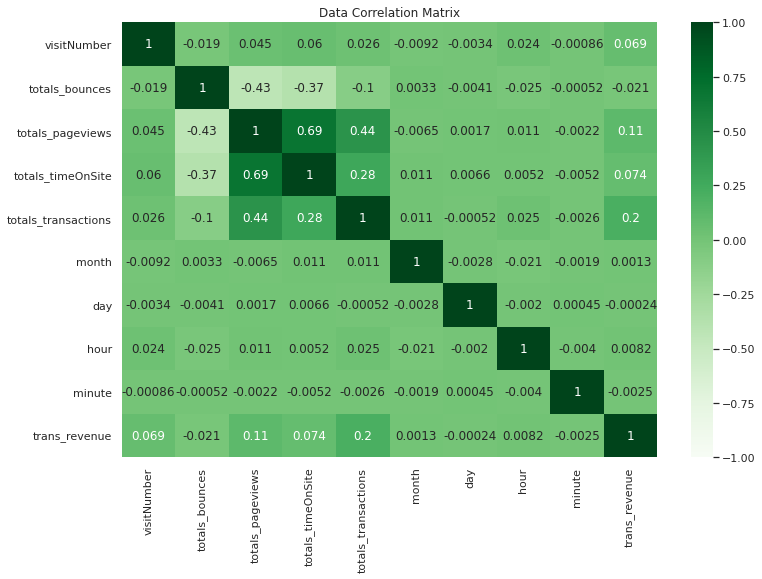

In [27]:
sns.set(font_scale = 1)
fig1 = plt.figure(figsize=(12,8));
data.corr()
plt.title('Data Correlation Matrix')
sns.heatmap(data.corr(), vmin = -1, vmax = 1, cmap = 'Greens', annot=True);

/opt/conda/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


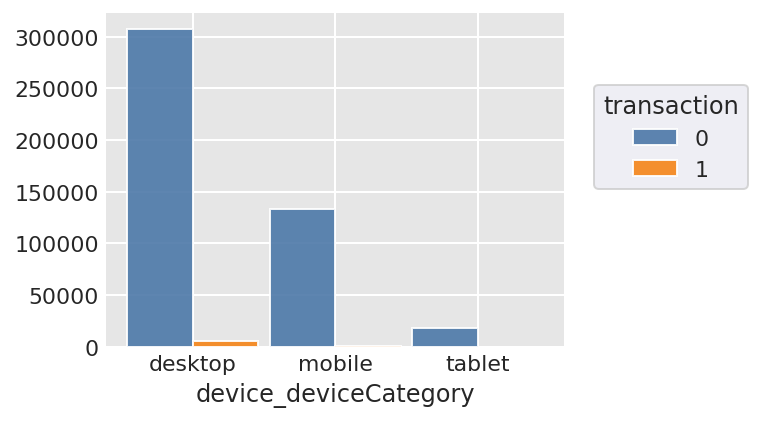

In [28]:
## Transactions by device category. Desktop has the highest transactions.

dxp.count(val='device_deviceCategory',data=data, split='transaction', figsize =(4,3))

/opt/conda/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


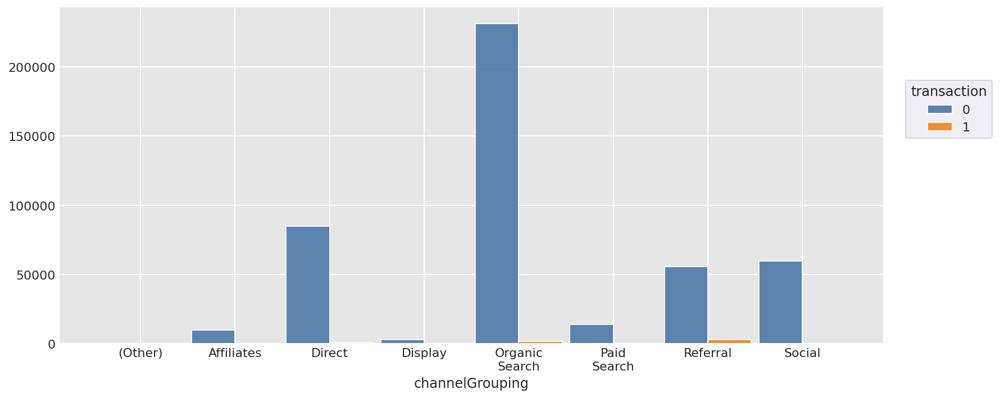

In [29]:
## Transactions by channel grouping. Organic search, direct, social and referral contribute to maximum transaction

dxp.count(val='channelGrouping',data=data, split='transaction', figsize =(11,5) )

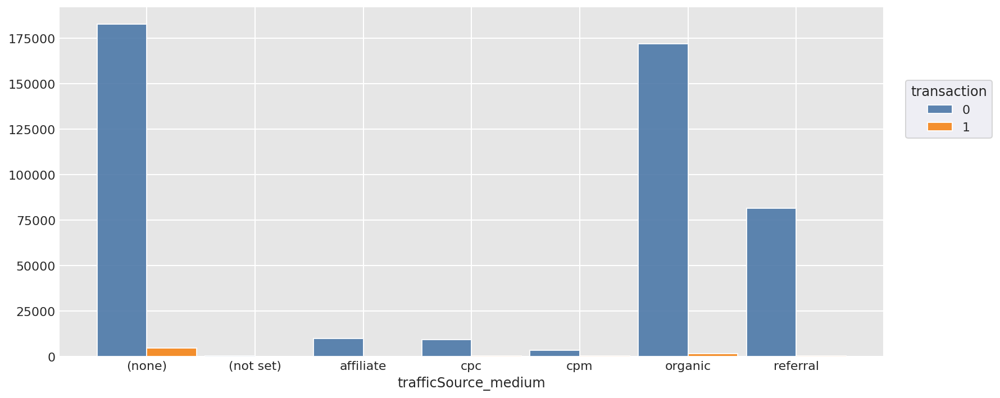

In [30]:
## Organic search and none leads to higher conversions.

dxp.count(val='trafficSource_medium',data=data, split='transaction', figsize =(11,5) )

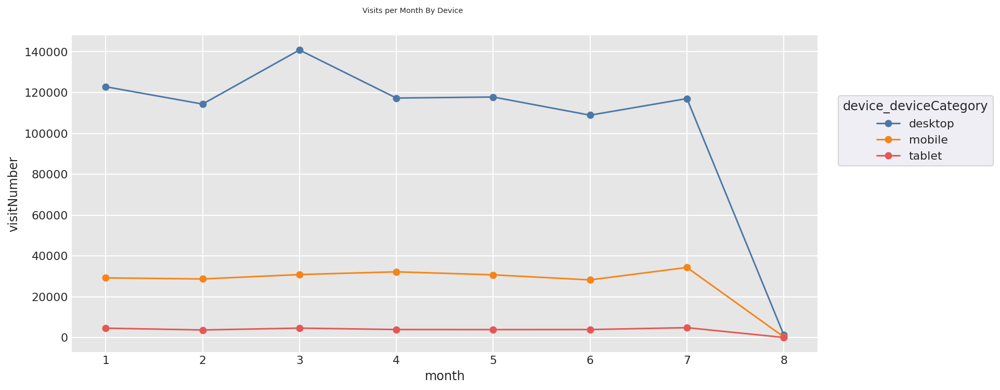

In [31]:
## Maximum visits are made in the month of March using device-desktop

dxp.line(x='month',
         y='visitNumber',
         data=data,
         aggfunc='sum',
         split='device_deviceCategory',
         title= 'Visits per Month By Device',
         figsize=(11,5))

/opt/conda/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


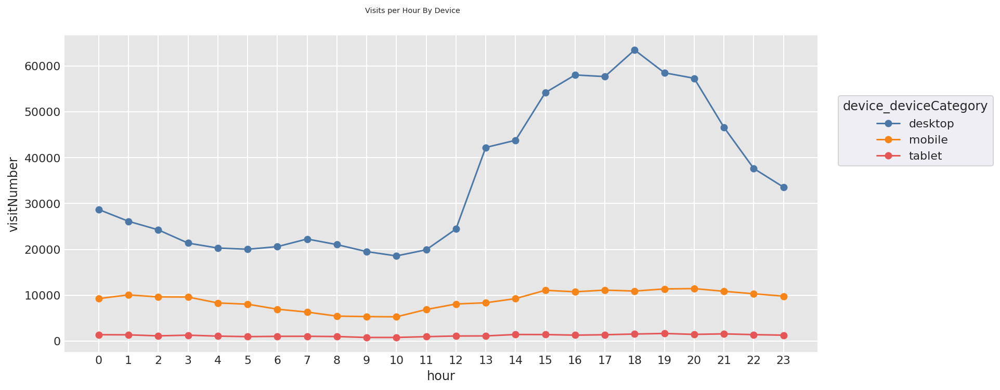

In [32]:
## Maximum visits are made during the evening time between 5-7PM on desktop.

dxp.line(x='hour',
         y='visitNumber',
         data=data,
         aggfunc='sum',
         split='device_deviceCategory',
         title= 'Visits per Hour By Device',
         figsize=(11,5))

### Encoding - We'll use Label Encoding for columns with more than three categories and One-hot encoding for columns upto three categories.

In [33]:
## Grouping columns

cols = ["channelGrouping", "geoNetwork_city", "device_operatingSystem", 
        "trafficSource_campaign", "trafficSource_medium", "trafficSource_source"]

col_few_labels = ["device_deviceCategory"]

In [34]:
## Converting categorical variables to integer using label encoder

from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder

labEnc = LabelEncoder()

for col in cols:
    data[col] = labEnc.fit_transform(data[col])

In [35]:
data = pd.get_dummies(data, columns =col_few_labels)

### Model Building - We'll first split our data into Features and Target Variables. Based on the problem statement our target variable will be column transactions.

In [36]:
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn import tree
from sklearn.metrics import confusion_matrix
from sklearn.tree import DecisionTreeClassifier, export_graphviz

import six
import sys
sys.modules['sklearn.externals.six'] = six
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO

import pydotplus
from IPython.display import Image

In [37]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 464704 entries, 0 to 464703
Data columns (total 20 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   visitNumber                    464704 non-null  int64  
 1   totals_bounces                 464704 non-null  float64
 2   totals_pageviews               464704 non-null  float64
 3   totals_timeOnSite              464704 non-null  float64
 4   totals_transactions            464704 non-null  float64
 5   trafficSource_source           464704 non-null  int64  
 6   trafficSource_medium           464704 non-null  int64  
 7   trafficSource_campaign         464704 non-null  int64  
 8   device_operatingSystem         464704 non-null  int64  
 9   geoNetwork_city                464704 non-null  int64  
 10  channelGrouping                464704 non-null  int64  
 11  month                          464704 non-null  int64  
 12  day                           

In [38]:
## Data Splitting

features = ['visitNumber', 'totals_bounces', 'totals_pageviews', 'totals_timeOnSite', 'trafficSource_source',
            'trafficSource_medium', 'trafficSource_campaign', 'device_operatingSystem', 'geoNetwork_city',
            'channelGrouping', 'month', 'day', 'hour', 'device_deviceCategory_desktop', 'device_deviceCategory_mobile']

# Features
X = data[features] 

# Target variable
y = data.transaction

In [39]:
## Checking shape of X & y
X.shape

(464704, 15)

In [40]:
y.shape

(464704,)

### Train-Test Split

In [41]:
# Splitting the data in 80:20 ratio (train : test).

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

### Model Building

In [42]:
# Creating classifer object

clf = DecisionTreeClassifier()

# Training the model

clf = clf.fit(X_train,y_train)

### Prediction on test data

In [43]:
y_pred = clf.predict(X_test)

### Model Evaluation - This is done by comparing the actual test set(y_test) and predicted values(y_pred).

In [44]:
metrics.accuracy_score(y_test, y_pred)

0.9806974317039843

### Conclusion - Our model accuracy is approximately 98%.

### Generating Confusion Matrix

In [45]:
## True Positive, True Negative, False Positive, False Negative

confusion_matrix(y_test, y_pred)

array([[90752,   999],
       [  795,   395]])

### Calculating Precision and Recall

### Visualization

In [46]:
out = StringIO()
export_graphviz(clf, out_file = out, filled = True, rounded = True, special_characters = True, 
                feature_names = features, class_names = ['0','1'])

graph = pydotplus.graph_from_dot_data(out.getvalue())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.108627 to fit



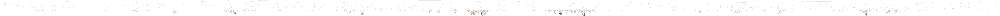

In [47]:
Image(graph.create_png())